In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import snapatac2 as snap
import torch

In [5]:
# import the package
import midaa as maa

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
%matplotlib inline

In [6]:
ad_atac = sc.read('../data/cd34_multiome_atac.h5ad')
ad_rna = sc.read('.,/data/cd34_multiome_rna_processed.h5ad')


FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = '.,/data/cd34_multiome_rna_processed.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [ ]:
# If you want to have some look at cell type markers
#sc.tl.rank_genes_groups(ad_rna, "celltype")
#sc.pl.rank_genes_groups(ad_rna, n_genes=30, sharey=False)

In [ ]:
ad_atac_hv = ad_atac

In [ ]:
# We get highly variables peaks and genes to speed up the computation
# and reduce noise
snap.pp.select_features(ad_atac, n_features=10000)

ad_atac_hv = ad_atac[:,ad_atac.var["selected"]].copy()
ad_atac_hv.raw = ad_atac_hv

ad_rna_hv = ad_rna[:,ad_rna.var["highly_variable"]].copy()


In [ ]:
# Usual norm -> log1p -> scale 

sc.pp.scale(ad_rna_hv)

sc.pp.normalize_total(ad_atac_hv)
sc.pp.log1p(ad_atac_hv)
sc.pp.scale(ad_atac_hv)


In [ ]:
# We interate from 2 to 11 to find a reasonable number of archetypes

MULT = 4
models = {}
for i in range(2,12):
    models[i] = maa.fit_maa(
        [ad_rna_hv.X, ad_atac_hv.X],
        [np.ones(ad_rna_hv.X.shape[0]), np.ones(ad_atac_hv.X.shape[0])],
        ["G", "G"],
        hidden_dims_dec_common = [64 * MULT, 128 * MULT],
        hidden_dims_dec_last = [256 * MULT],
        hidden_dims_enc_ind = [128 * MULT],
        hidden_dims_enc_common = [64 * MULT],
        hidden_dims_enc_pre_Z = [32 * MULT],
        lr = 0.0005,
        gamma_lr = 0.1,
        steps = 3000, 
        narchetypes = i,
        batch_size = 9000,
        torch_seed = 3
    )

2024-03-25 15:02:03 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2024-03-25 15:02:03 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


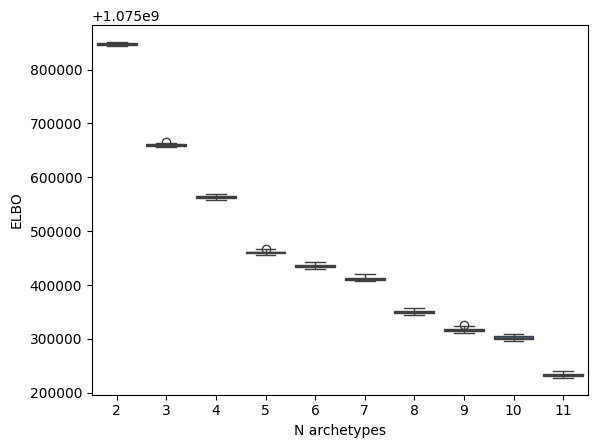

In [15]:
# We plot the ELBOs, 5 seems reasonable

maa.plot_ELBO_across_runs(models, 2800)

In [ ]:
best_model = models[5]

torch.save(best_model["deepAA_obj"].state_dict(), "best_model_aa_state_dict.pth")
torch.save(best_model["inferred_quantities"], "best_model_aa_inferred_quantities.pth")
torch.save({k:v["ELBO"] for k,v in models.items()}, "ELBO_dict.pth")

In [ ]:
# From loaded model

elbo_dict = torch.load("ELBO_dict.pth")
ELBOS = {k:{"ELBO": v} for k,v in elbo_dict.items()}
maa.plot_ELBO_across_runs(ELBOS, 2800)

In [19]:
# Let's start from the state dictionary
# We first need to initialize an instance of the model


MULT = 4


best_model = maa.fit_maa(
        [ad_rna_hv.X, ad_atac_hv.X],
        [np.ones(ad_rna_hv.X.shape[0]), np.ones(ad_atac_hv.X.shape[0])],
        ["G", "G"],
        hidden_dims_dec_common = [64 * MULT, 128 * MULT],
        hidden_dims_dec_last = [256 * MULT],
        hidden_dims_enc_ind = [128 * MULT],
        hidden_dims_enc_common = [64 * MULT],
        hidden_dims_enc_pre_Z = [32 * MULT],
        lr = 0.0005,
        gamma_lr = 0.1,
        steps = 1, 
        linearize_encoder = False,
        linearize_decoder = False,
        narchetypes = 5,
        batch_size = 100000,
        torch_seed = 3
    )

ELBO: 412757856.00000  : 100%|██████████| 1/1 [01:35<00:00, 95.06s/it]
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/pyro/primitives.py:137: RuntimeWarning: trying to observe a value outside of inference at loss
  warnings.warn(


In [20]:
# Then we load the pre-trained weights
maa.load_model_from_state_dict(best_model,[ad_rna_hv.X, ad_atac_hv.X], "best_model_aa_state_dict.pth")

In [21]:
# Here we add the archetypes scores to the obs in the adata
ad_rna, arc_names = maa.add_to_obs_adata(best_model, ad_rna)
ad_atac, arc_names = maa.add_to_obs_adata(best_model, ad_atac)

/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


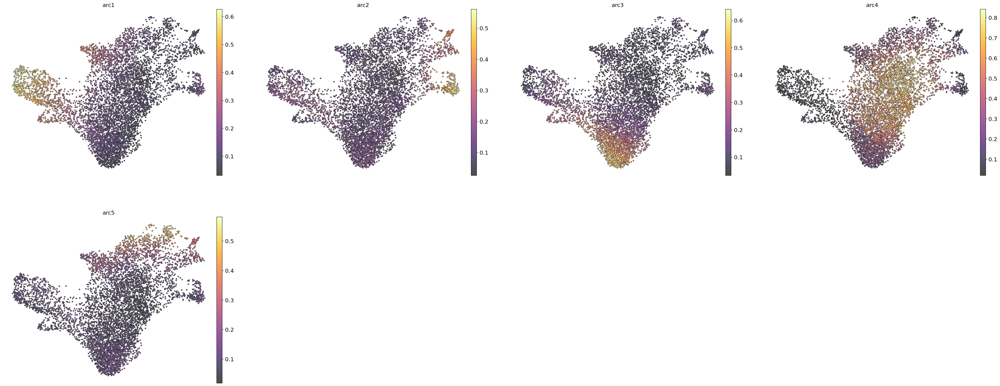

In [22]:
sc.set_figure_params(figsize = [10,8])

sc.pl.umap(ad_rna, color=arc_names, cmap = "inferno", frameon = False, add_outline=True)

/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


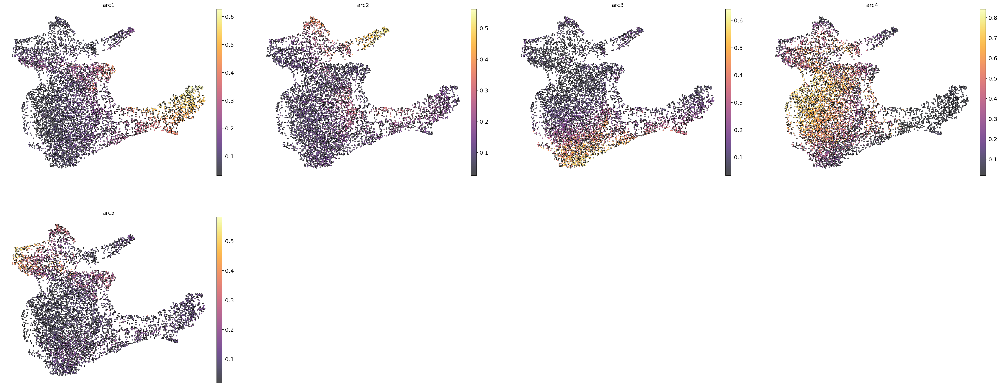

In [23]:
sc.set_figure_params(figsize = [10,8])

sc.pl.umap(ad_atac, color=arc_names,  cmap = "inferno", frameon = False, add_outline=True)

/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


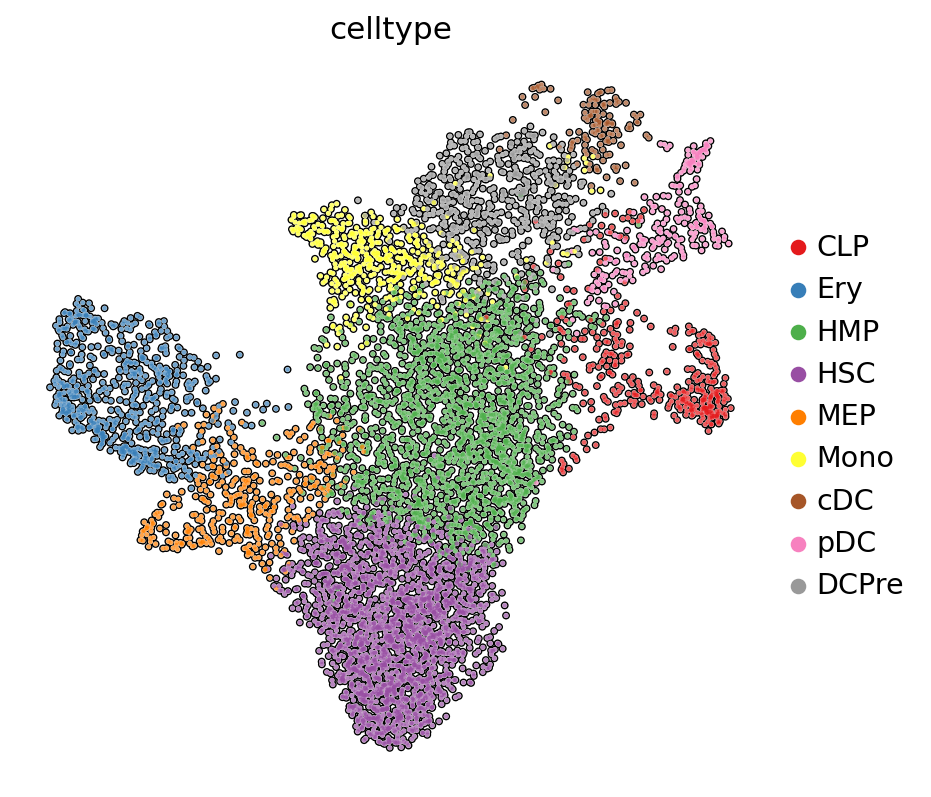

/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


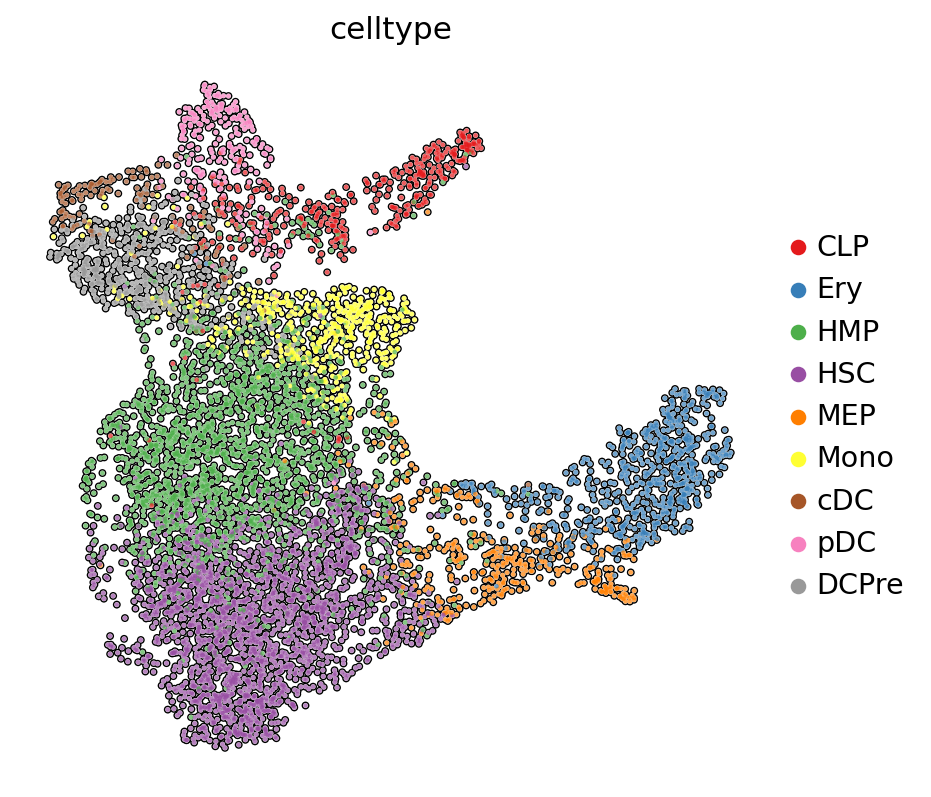

In [24]:
sc.set_figure_params( figsize = [6,6])

sc.pl.umap(ad_rna, color="celltype",  palette = "Set1", frameon = False, add_outline=True)

sc.pl.umap(ad_atac, color="celltype", palette = "Set1", frameon = False, add_outline=True)

In [27]:
# 2d plots of he archetype simplex

maa.plot_archetypes_simplex(best_model,  s =  15)


In [28]:
maa.plot_archetypes_simplex(best_model,  s =  5, color_by=ad_rna.obs["celltype"], cmap = "Set1")


In [29]:
# Here we run chromavar to look at TF accesibility
# This takes a while so we share the final results 


import muon as mu
import mudata
from muon import atac as ac
from pyjaspar import jaspardb
import pychromvar as pc


mdata = mudata.MuData({"rna": ad_rna, "atac": ad_atac})


In [ ]:
pc.get_genome("hg38", output_dir="./")


In [ ]:
pc.add_peak_seq(mdata, genome_file="./hg38.fa", delimiter=":|-")
pc.add_gc_bias(mdata)
pc.get_bg_peaks(mdata)

# get motifs
jdb_obj = jaspardb(release='JASPAR2020')
motifs = jdb_obj.fetch_motifs(
    collection = 'CORE',
    tax_group = ['vertebrates'])

pc.match_motif(mdata, motifs=motifs)

100%|██████████| 246113/246113 [01:31<00:00, 2696.06it/s]


In [ ]:
dev = pc.compute_deviations(mdata)

In [ ]:
dev.write_h5ad("chromvar_deviations.h5ad")

In [30]:
# Start from here if you don't want to recompute the deviations
dev = sc.read_h5ad("chromvar_deviations.h5ad")

In [31]:
# A little bit of rearranging of the adata
mdata.mod['chromvar'] = dev
mdata.mod['chromvar'].raw = dev
mdata["chromvar"].obsm["X_umap"] = mdata["rna"].obsm["X_umap"]

In [32]:
mdata.obsm["rna_umap"] = mdata["rna"].obsm["X_umap"]
mdata.obsm["atac_umap"] = mdata["atac"].obsm["X_umap"]


/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


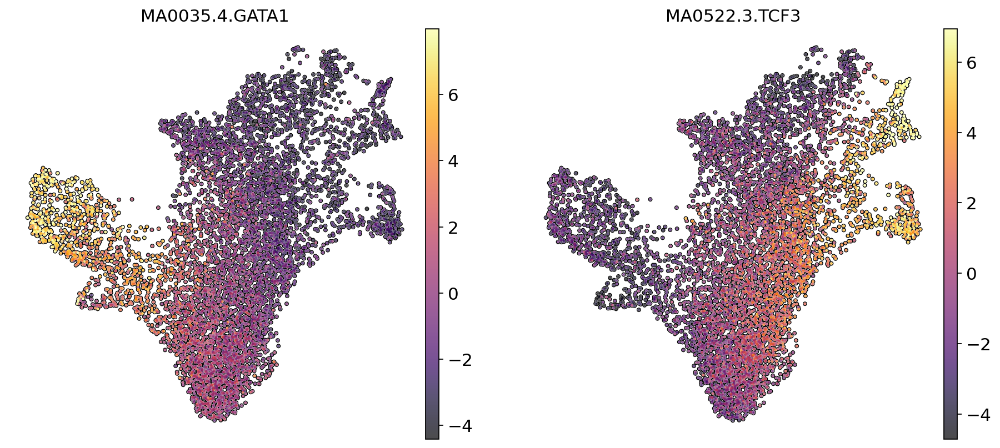

In [33]:
# We can now look at TFs accessibility
sc.pl.umap(mdata["chromvar"], color=['MA0035.4.GATA1', "MA0522.3.TCF3"], cmap = "inferno", frameon = False, add_outline=True, vmin='p1', vmax='p99')

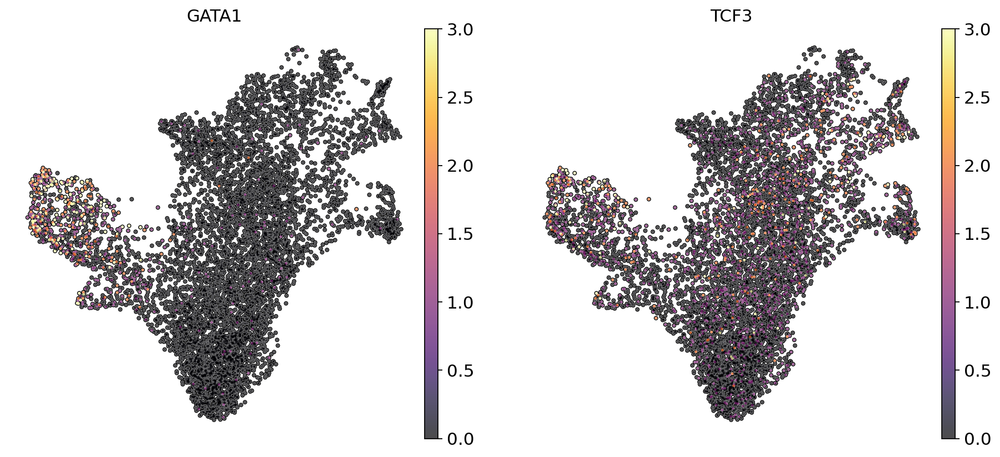

In [34]:
sc.pl.umap(mdata["rna"], color=['GATA1', "TCF3"], cmap = "inferno", frameon = False, add_outline=True, vmin='p1', vmax='p99')


In [35]:
# Here we compare archetype weights and accessibility of some 
# marker TFs (if you rerun the analysis by yourself) the
# archetype number might change, but results should be similar

df_plot_1 = pd.DataFrame({
 "TCF3" : np.array(mdata["chromvar"][:,"MA0522.3.TCF3"].X).flatten(),
 "modality" : "atac",
 "archetype2" : mdata["rna"].obs["arc2"]
}, index = mdata["rna"].obs.index)


df_plot_2 = pd.DataFrame({
 "GATA1" : np.array(mdata["chromvar"][:,"MA0035.4.GATA1"].X).flatten(),
 "modality" : "atac",
 "archetype1" : mdata["rna"].obs["arc1"]
}, index = mdata["rna"].obs.index)

In [36]:
df_plot = pd.concat([df_plot_1, df_plot_2])

In [37]:
from plotnine import ggplot, geom_point, aes, stat_smooth, facet_wrap, xlim, theme_classic, theme, ggtitle, ggsave

ggsave(
    ggplot(df_plot_2, aes("archetype1", "GATA1", alpha="archetype1"))
    + geom_point(color = "lightblue")
    + stat_smooth(color = "darkblue") +
    xlim([0.1,0.77]) + theme_classic() + theme(legend_position = "none") +
    ggtitle("GATA1 accesibility") 
, "GATA_vs_arch1.pdf", width=3, height= 2, dpi=300)

/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3 x 2 in image.
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: GATA_vs_arch1.pdf
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 2510 rows containing missing values.


In [38]:
ggsave(
    ggplot(df_plot_1, aes("archetype2", "TCF3", alpha="archetype2"))
    + geom_point(color = "lightblue")
    + stat_smooth(color = "darkblue") +
    xlim([0.1,0.75]) + theme_classic() + theme(legend_position = "none") +
    ggtitle("TCF3 accesibility")
, "TCF3_vs_arch2.pdf", width=3, height= 2, dpi=300)

/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3 x 2 in image.
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: TCF3_vs_arch2.pdf
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 2485 rows containing missing values.


In [39]:
# Here we try to simulate the data from the archetype distrivution, again 
# results might be different on your machine if you decided to 
# rerun the archetype fit

# Here we specify the dirichlet distribution
AA_distribution = torch.tensor([1e-16,1e-16, 2,1, 2]).cpu()

# This actually generates the data, the _ stands for the side data, that we did not use here
synthetic_matrices, _ = maa.generate_synthetic_data(best_model, AA_distribution, seed = 6, to_cpu = True)

In [40]:
import anndata as ad

# We create a fake anndata

cell_names = ["Cell_" + str(i) for i in range(synthetic_matrices[0].shape[0])]

ad_synt_rna = ad.AnnData(synthetic_matrices[0].detach().numpy()) 
ad_synt_rna.obs_names = cell_names
ad_synt_rna.var_names = ad_rna_hv.var_names

sc.pp.scale(ad_synt_rna)

sc.tl.pca(ad_synt_rna)

In [42]:
sc.pp.neighbors(ad_synt_rna, )
sc.tl.umap(ad_synt_rna )


/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


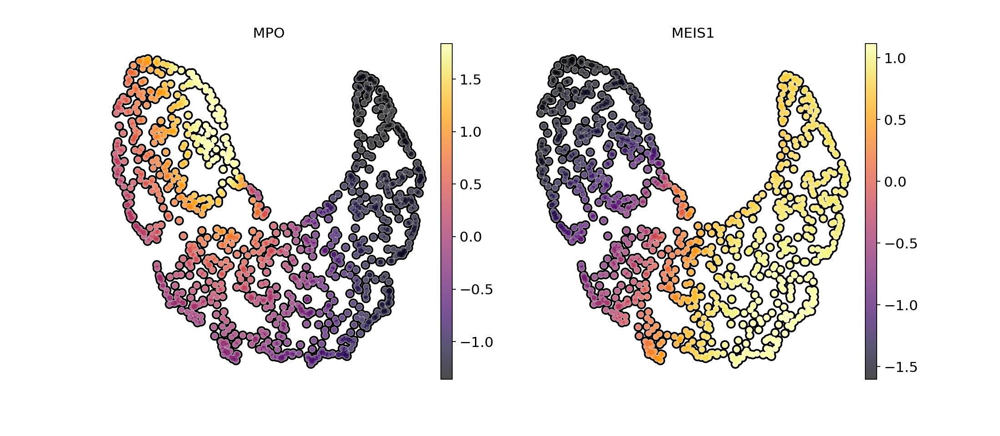

In [44]:
# And plot some markers in RNA
sc.pl.umap(ad_synt_rna, color=[ "MPO", "MEIS1"],  save = "umap_rna_markers_synthetic.pdf", cmap = "inferno", frameon = False, add_outline=True,  vmax = "p95")


In [45]:
ad_atac_hv.var[ad_atac_hv.var["nearestGene"] == "MPO"]

,seqnames,start,end,width,strand,score,replicateScoreQuantile,groupScoreQuantile,Reproducibility,GroupReplicate,...,distToGeneStart,peakType,distToTSS,nearestTSS,GC,idx,count,selected,mean,std
chr17:58281664-58282164,chr17,58281664,58282164,501,*,218.00801,0.988,0.979,2,C13._.cd34_multiome_rep1,...,12058,Promoter,978,uc061tab.1,0.5329,8061,1988.0,True,0.128271,0.371953


In [ ]:
ad_atac_hv.var[ad_atac_hv.var["nearestGene"] == "MEIS1"]

In [46]:
import anndata as ad


ad_synt_atac = ad.AnnData(synthetic_matrices[1].detach().numpy())
ad_synt_atac.obs_names = cell_names
ad_synt_atac.var_names = ad_atac_hv.var_names
ad_synt_atac.var = ad_atac_hv.var

sc.pp.scale(ad_synt_atac)

In [47]:
ad_synt_atac.obsm["X_umap"] = ad_synt_rna.obsm["X_umap"]

/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


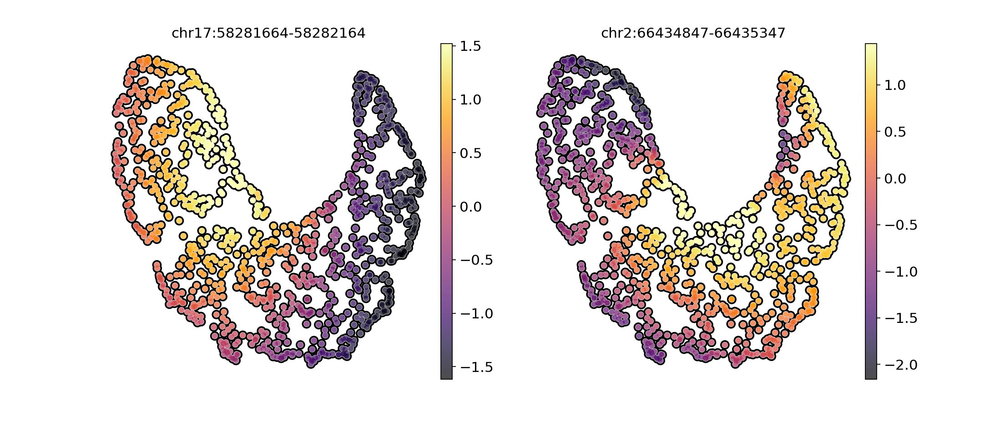

In [48]:
# and in ATAC 

sc.pl.umap(ad_synt_atac, color = [ "chr17:58281664-58282164", "chr2:66434847-66435347"],  save = "umap_atac_markers_synthetic.pdf", cmap = "inferno", frameon = False, add_outline=True,  vmax = "p95")


In [353]:
# We then save out synthetic data

ad_synt_atac.write_h5ad("synthetic_atac.h5ad")
ad_synt_rna.write_h5ad("synthetic_rna.h5ad")